# 1. Introduction

This notebook focuses on evaluating the best-performing Vision Transformer (ViT) model obtained from the Vision_Transformer notebook. The highest-performing model is Version 7, which corresponds to a ViT-Base architecture without a classification hidden layer, trained without transfer learning.

Notably, in this use case, training the entire backbone from scratch has yielded superior prediction accuracy and required fewer epochs compared to employing transfer learning.

The following table summarizes the characteristics and the training parameters of the selected model.

| Version | **ViT Type** | **Patch Size** | **Encoding Layers** | **Hidden Size** | **Multi-layer Perceptron size** | **Attention Heads** | **Hidder Layer Units for Classification** | **Transfer Learning** | **Number of Epochs** | **Learning Rate** | **Scheduler** | **Params**
| ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- |
| 7 | Base | 16x16 | 12 | 768 | 3072 | 12 | None | No | 10 | 0.0001 | CosineAnnealingLR | 85.9M |

# 2. Importing Libraries

In [1]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch
import seaborn as sns

from torchvision.transforms import v2
from pathlib import Path

from helper_functions import create_dataloaders, set_seeds, get_most_wrong_examples, load_model
from engine import train, pred_and_store
from vision_transformer import ViT

# Define some constants
NUM_WORKERS = os.cpu_count()
BATCH_SIZE = 64
AMOUNT_TO_GET = 1.0
SEED = 42

# Define target data directory
target_dir_name = f"../data/food-101_{str(int(AMOUNT_TO_GET*100))}_percent"

# Setup training and test directories
target_dir = Path(target_dir_name)
train_dir = target_dir / "train"
test_dir = target_dir / "test"
target_dir.mkdir(parents=True, exist_ok=True)

# Create target model directory
model_dir = Path("../models")

# Set seeds
set_seeds(SEED)

In [2]:
# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# 2. Creating Dataloaders

In [3]:
# Image size
IMG_SIZE = 224

# Manual transforms for the training dataset
manual_transforms = v2.Compose([           
    v2.RandomCrop((IMG_SIZE, IMG_SIZE)),    
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),    
])

# ViT-Base transforms
# Manual transforms for the training dataset
manual_transforms_aug_norm_train_vitb = v2.Compose([    
    v2.TrivialAugmentWide(),
    v2.Resize((256, 256)),
    v2.RandomCrop((IMG_SIZE, IMG_SIZE)),    
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]) 
])

# Manual transforms for the test dataset
manual_transforms_aug_norm_test_vitb = v2.Compose([    
    v2.Resize((256, 256)),
    v2.RandomCrop((IMG_SIZE, IMG_SIZE)),    
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]) 
])

In [4]:
# Create data loaders
_, test_dataloader_vit, class_names = create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    train_transform=manual_transforms_aug_norm_train_vitb,
    test_transform=manual_transforms_aug_norm_test_vitb,
    batch_size=BATCH_SIZE
)

# 3. Evaluating ViT-Base - Version 3

The model will be evaluated using the test dataset with the following metrics: accuracy, loss, model size (MB), average prediction time per image (sec), and average predited images per second (frames/sec)

In [5]:
# Load ViT-Base - Version 3: 
model_type="vitbase16_5"
model_name = f"{model_type}"
vitbase16_3_model_name = model_name + ".pth"
vitbase16_3_results_df = model_name + ".csv"

# Instantiate the model
vitbase16_3_model = ViT(
    img_size=IMG_SIZE,
    in_channels=3,
    patch_size=16,
    num_transformer_layers=12,
    emb_dim=768,
    mlp_size=3072,
    num_heads=12,
    attn_dropout=0,
    mlp_dropout=0.1,
    emb_dropout=0.1,
    num_classes=len(class_names)
)

# Load the trained weights
vitbase16_3_model = load_model(model=vitbase16_3_model,
                               model_weights_dir=model_dir,
                               model_weights_name=vitbase16_3_model_name)

# Load the training results
vitbase16_3_results = pd.read_csv(os.path.join(model_dir, vitbase16_3_results_df))

[INFO] Loading model from: ..\models\vitbase16_5.pth


## 3.1 Making Predictions on the CPU (Intel Core i9-9900K@3.60GHz)

In [6]:
# Make predictions on the CPU to compute the average prediction time per image
pred_list_cpu, classif_report_cpu = pred_and_store(
    test_dir=test_dir,
    model=vitbase16_3_model,
    transform=manual_transforms_aug_norm_test_vitb,
    class_names=class_names,
    percent_samples=1,
    device="cpu") # make predictions on CPU

[INFO] Finding all filepaths ending with '.jpg' in directory: ..\data\food-101_100_percent\test


  0%|          | 0/25250 [00:00<?, ?it/s]

## 3.2 Making Predictions on the GPU (NVIDIA GeForce RTX 4070)

In [6]:
# Make predictions on the GPU to compute the average prediction time per image
pred_list_gpu, classif_report_gpu = pred_and_store(
    test_dir=test_dir,
    model=vitbase16_3_model,
    transform=manual_transforms_aug_norm_test_vitb,
    class_names=class_names,
    percent_samples=1,
    device=device)

[INFO] Finding all filepaths ending with '.jpg' in directory: ..\data\food-101_100_percent\test


  0%|          | 0/25250 [00:00<?, ?it/s]

## 3.3. Collecting Data

In [7]:
# Create a dictionary with the results for this model, in terms 
effnetb2_dict = {}
effnetb2_dict['Model Name'] = model_name
effnetb2_dict['Test Acc'] = round(vitbase16_3_results['test_acc'].iloc[-1], 2)
effnetb2_dict['Test los'] = round(vitbase16_3_results['test_loss'].iloc[-1], 2)
effnetb2_dict['Model Size [MB]'] = round(Path(os.path.join(model_dir, vitbase16_3_model_name)).stat().st_size // (1024*1024), 2)
effnetb2_dict['No Params [Million]'] = round(sum(p.numel() for p in vitbase16_3_model.parameters()) / 1000000, 2)
effnetb2_dict['CPU: Prediction Time - Mean [s]'] = round(pd.DataFrame(pred_list_cpu)['time_for_pred'].mean(), 2)
effnetb2_dict['CPU: Predicted Images per Sec [fps]'] = round(1.0 / effnetb2_dict['Prediction Time - Mean [s]'], 2)
effnetb2_dict['GPU: Prediction Time - Mean [s]'] = round(pd.DataFrame(pred_list_gpu)['time_for_pred'].mean(), 2)
effnetb2_dict['GPU: Predicted Images per Sec [fps]'] = round(1.0 / effnetb2_dict['Prediction Time - Mean [s]'], 2)

# Convert to dataframe
pd.DataFrame.from_dict(effnetb2_dict, orient="index", columns=["Value"])

NameError: name 'pred_list_cpu' is not defined

# 4. Identifying the Worst-performing Classes

In [ ]:
# Identify the worst-performing classes based on F1-score
df_metrics = pd.DataFrame(classif_report_cpu).transpose()
df_metrics = df_metrics.iloc[:-3]
df_metrics = df_metrics.iloc[:,0:3]

# Determine the worst-performing classes on the f1-score
df_worst_class = df_metrics.sort_values(by='f1-score', ascending=True).reset_index()
df_worst_class.columns = ['Class', 'Precision', "Recall", "F1-Score"]
df_worst_class.head(5)

,Class,Precision,Recall,F1-Score
0,chocolate_mousse,0.464286,0.650000,0.541667
1,chocolate_cake,0.733333,0.523810,0.611111
2,bread_pudding,0.789474,0.517241,0.625000
3,foie_gras,0.652174,0.625000,0.638298
4,gnocchi,0.629630,0.653846,0.641509


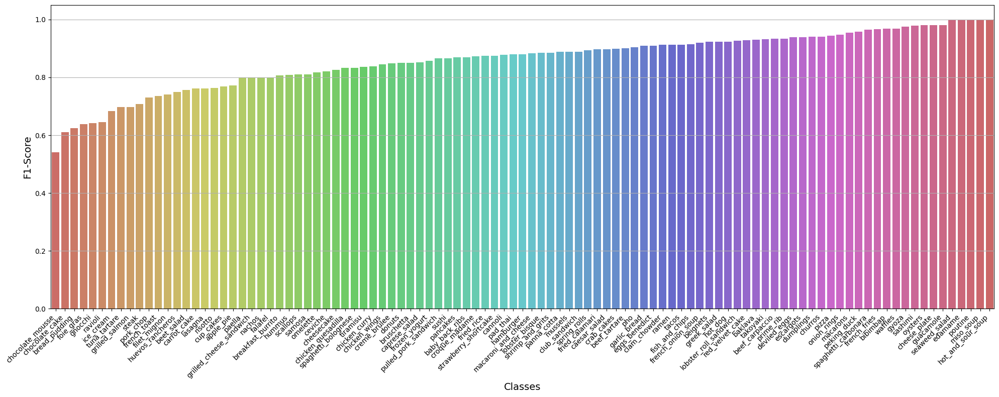

In [ ]:
# Create a barplot for F1-scores
plt.figure(figsize=(20, 8))
sns.barplot(
    data=df_worst_class,
    x="Class",
    y="F1-Score",
    hue="Class",
    palette="hls",
    dodge=False,
    legend=False,
)

# Add labels and title
#plt.title("F1-Score of Classes", fontsize=16)
plt.xlabel("Classes", fontsize=14)
plt.ylabel("F1-Score", fontsize=14)

# Rotate x-axis labels to 45 degrees
plt.xticks(rotation=45, ha="right", fontsize=10)

# Improve layout
plt.tight_layout()
plt.grid(visible=True, which="both", axis="y")
plt.show()

# 5. Identifying the Worst-performing Test Samples

Making predictions:   0%|          | 0/395 [00:00<?, ?it/s]

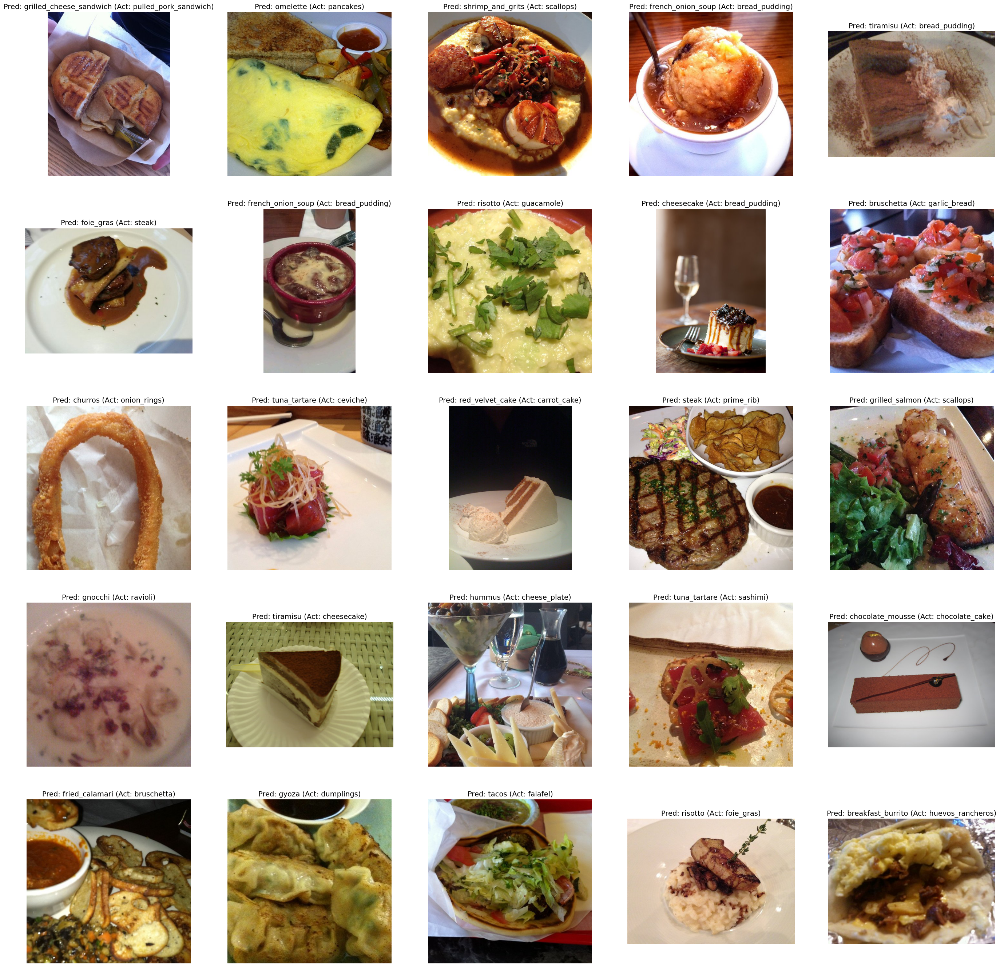

In [ ]:
df_top_wrong = get_most_wrong_examples(
    model=vitbase16_3_model,
    test_dataloader=test_dataloader_vit,
    num_samples=25,
    plot_images=True,
    n_cols=5,
    title_font_size=14,
    device=device
    )